In [ ]:
# To install from master
!pip install git+https://github.com/faustomorales/keras-ocr.git#egg=keras-ocr

# !python /content/keras-ocr/setup.py
# To install from PyPi
# !pip install keras-ocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/faustomorales/keras-ocr.git to /tmp/pip-install-e6gac5ap/keras-ocr_40bb37035c1c4e00adec94ba67fd650d
  Running command git clone -q https://github.com/faustomorales/keras-ocr.git /tmp/pip-install-e6gac5ap/keras-ocr_40bb37035c1c4e00adec94ba67fd650d
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


In [ ]:
import cv2
import time
import glob
import numpy as np
import matplotlib.pyplot as plt
import keras_ocr
import tensorflow as tf
print(tf.__version__)
pipeline = keras_ocr.pipeline.Pipeline()

2.8.2
Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


In [ ]:
import pandas as pd
kk = pd.DataFrame(columns = ['img_name', 'xmin', 'ymin', 'xmax', 'ymax', 'words'])
kk.to_csv('bbox.csv', index_label=True)

# New Section

In [ ]:
data = pd.read_csv('/content/bbox.csv')
data.head()

,True,img_name,xmin,ymin,xmax,ymax,words


In [ ]:
img_dir = "/content/"
imput_img_dir = [glob.glob(f"{img_dir}*{e}") for e in ['.jpg', '.png']]
imput_img_dir = [i for i in imput_img_dir if len(i)][0]
print(imput_img_dir)

['/content/test.png', '/content/Loot Zone.png', '/content/Screenshot 2022-07-21 at 12.34.37 AM.png']


test.png
Loot Zone.png
Screenshot 2022-07-21 at 12.34.37 AM.png


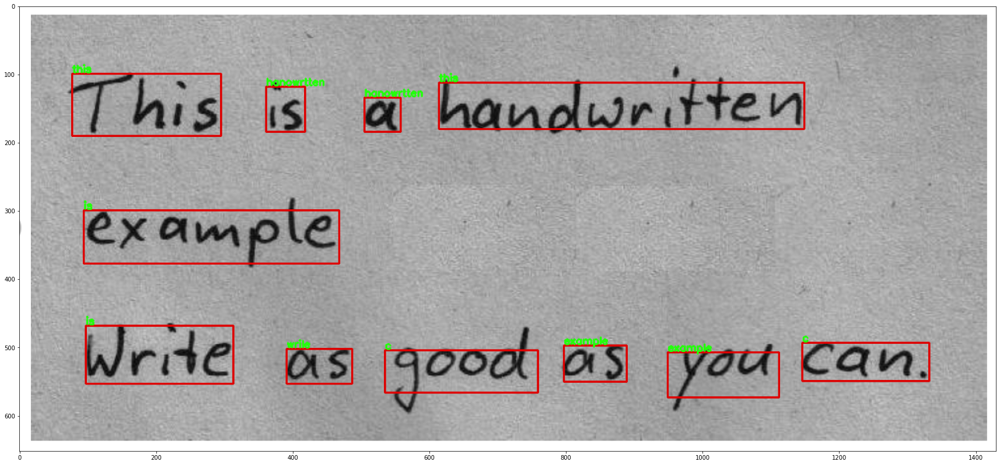

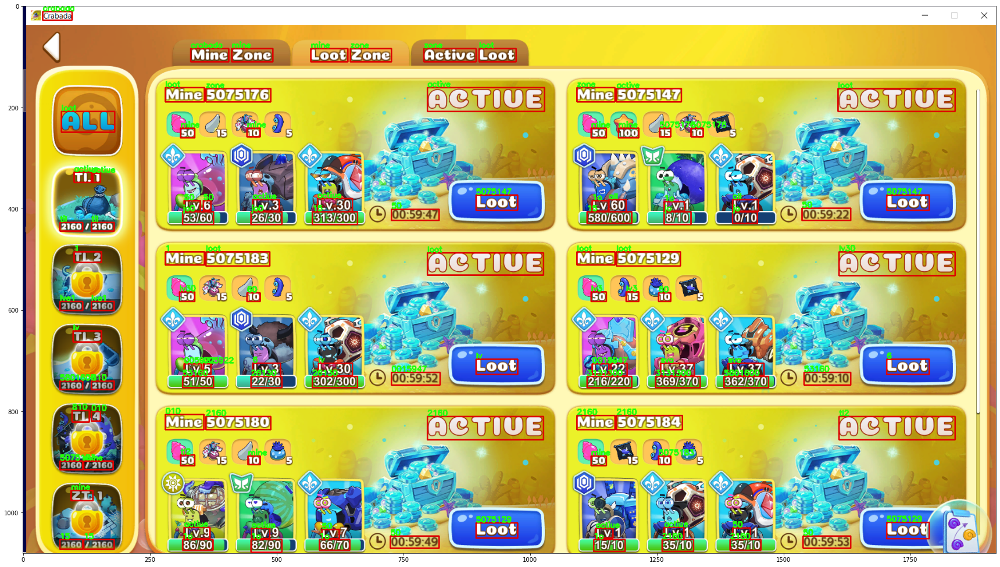

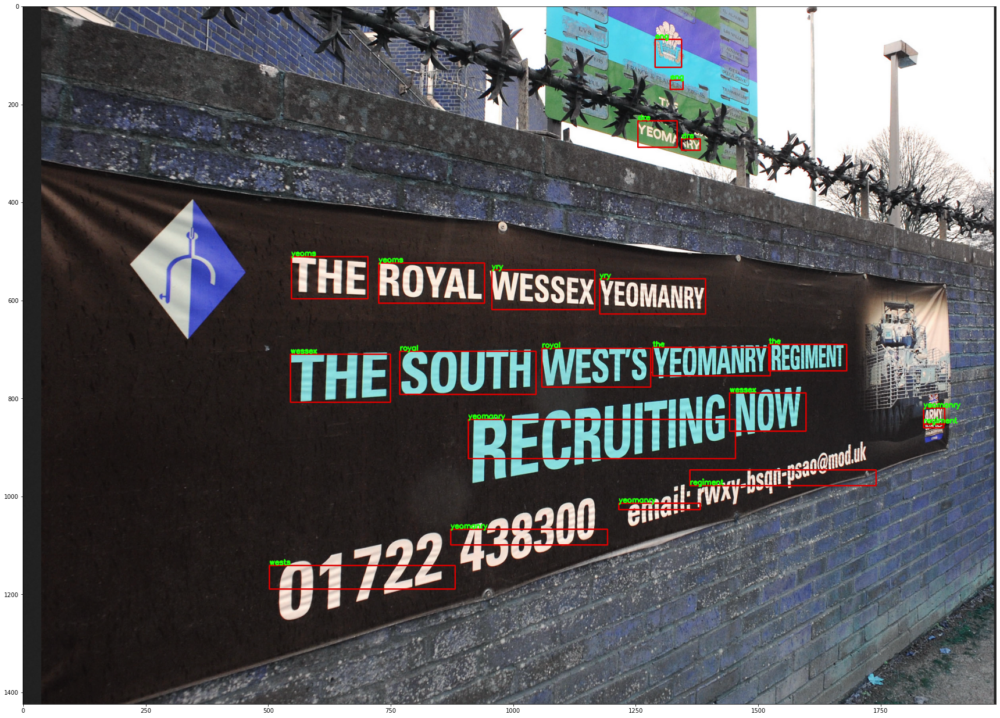

In [ ]:
# img_dir = "/content/my_data/"
# imput_img_dir = [glob.glob(f"{img_dir}*{e}") for e in ['.jpg', '.png']][0]
# print(imput_img_dir)
# glob.glob('/content/*.jpg')
images = [keras_ocr.tools.read(url) for url in imput_img_dir]
# images = [
#     keras_ocr.tools.read(url) for url in [
#         'https://upload.wikimedia.org/wikipedia/commons/b/bd/Army_Reserves_Recruitment_Banner_MOD_45156284.jpg',
#         # 'https://upload.wikimedia.org/wikipedia/commons/e/e8/FseeG2QeLXo.jpg',
#         # '/content/Loot Zone.png',
#         'https://upload.wikimedia.org/wikipedia/commons/b/b4/EUBanana-500x112.jpg'
#     ]
# ]
# imput_img_dir = [
#         'https://upload.wikimedia.org/wikipedia/commons/b/bd/Army_Reserves_Recruitment_Banner_MOD_45156284.jpg',
#         # 'https://upload.wikimedia.org/wikipedia/commons/e/e8/FseeG2QeLXo.jpg',
#         # '/content/Loot Zone.png',
#         'https://upload.wikimedia.org/wikipedia/commons/b/b4/EUBanana-500x112.jpg'
#     ]
# Each list of predictions in prediction_groups is a list of
# (word, box) tuples.



#images are numpy array
prediction_groups = pipeline.recognize(images)


def drow_rectangle_box(img_array, xmin_ymin, xmax_ymax, words):
    image = np.copy(img_array)
    color = (222,0,0)
    for a, b, word in zip(xmin_ymin, xmax_ymax, words):
        # print(a, b, word)
        image = cv2.rectangle(image,(int(a[0]), int(a[1])),(int(b[0]), int(b[1])), color, 2)
        image = cv2.putText(image, word, (int(a[0]), int(a[1]) - 2),cv2.FONT_HERSHEY_SIMPLEX, 0.5, (36,255,12), 2)
        # plt.figure(figsize=(30, 30))
        # plt.imshow(image)
        # time.sleep(10)
    return image


def convert_poins(prediction_groups):
    xmin_ymin = []
    xmax_ymax = []
    words = []
    for multi_pt in prediction_groups:
        for single_pt in multi_pt:
            # print(single_pt)
            words.append(single_pt[0])
            xmin_ymin.append(tuple(single_pt[1][0]))
            xmax_ymax.append(tuple(single_pt[1][2]))
            words.append(single_pt[0])
    return words, xmin_ymin ,xmax_ymax




def write_csv(path, b):
    kk = pd.DataFrame({'img_name' : [path.split('/')[-1]] , "xmin":[b[0]], "ymin":[b[1]], "xmax":[b[2]], "ymax":[b[3]] , "words" :[b[4]]})
    kk.to_csv("bbox.csv", mode="a+", header= False)

boundingbox=list()
for inx, img_path in enumerate(imput_img_dir):
    print(img_path.split('/')[-1])
    words, a, b= convert_poins([prediction_groups[inx]])
    for word, i, j in zip(words, a, b):
        bbox = [int(i[0]), int(i[1]), int(j[0]), int(j[1]), word]
        boundingbox.append(bbox)
        # kk = pd.DataFrame({'img_name' : [img_path.split('/')[-1]] , "xmin":[bbox[0]], "ymin":[bbox[1]], "xmax":[bbox[2]], "ymax":[bbox[3]] })
        # kk.to_csv("bbox.csv", mode="a+", header= False, index_label=True)
        write_csv(img_path, bbox)


    img = cv2.imread(img_path)
    img = drow_rectangle_box(img ,a, b, words)

    plt.figure(figsize=(30, 30))
    plt.imshow(img)

In [ ]:
# for i in prediction_groups[inx]
# for single_pt in prediction_groups[inx]:
#     print(single_pt)
#     print(single_pt[0])
#     print(single_pt[1][0])
#     break

In [ ]:
img = cv2.rectangle(img,(int(39.375), int(11.25)),(int(97.5), int(28.125)), (222, 0, 0), 2)
img = cv2.putText(img, 'test', (int(39.375), int(11.25) - 5),cv2.FONT_HERSHEY_SIMPLEX, 0.5, (36,255,12), 2)

In [ ]:
img = cv2.imread('/content/Loot Zone.png')

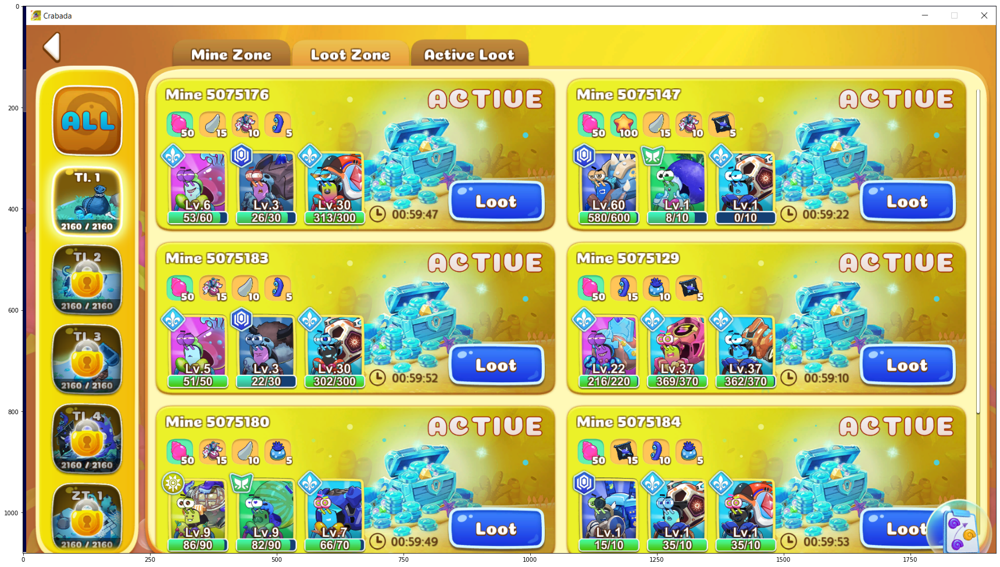

In [ ]:
plt.figure(figsize=(30, 30))
plt.imshow(img)


In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')
# images

In [ ]:
import tensorflow as tf
model_path = '/home/vsrira10/Desktop/model.hdf5'
model = tf.keras.models.load_model(model_path)
tf.keras.experimental.export_savedmodel(model,newdir)

In [ ]:
# To install from master
!pip install git+https://github.com/faustomorales/keras-ocr.git#egg=keras-ocr

# To install from PyPi
!pip install keras-ocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/faustomorales/keras-ocr.git to /tmp/pip-install-8ztk1xfd/keras-ocr_590d684a8f504569b51ff26b0ced0f57
  Running command git clone -q https://github.com/faustomorales/keras-ocr.git /tmp/pip-install-8ztk1xfd/keras-ocr_590d684a8f504569b51ff26b0ced0f57
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


TypeError: ignored

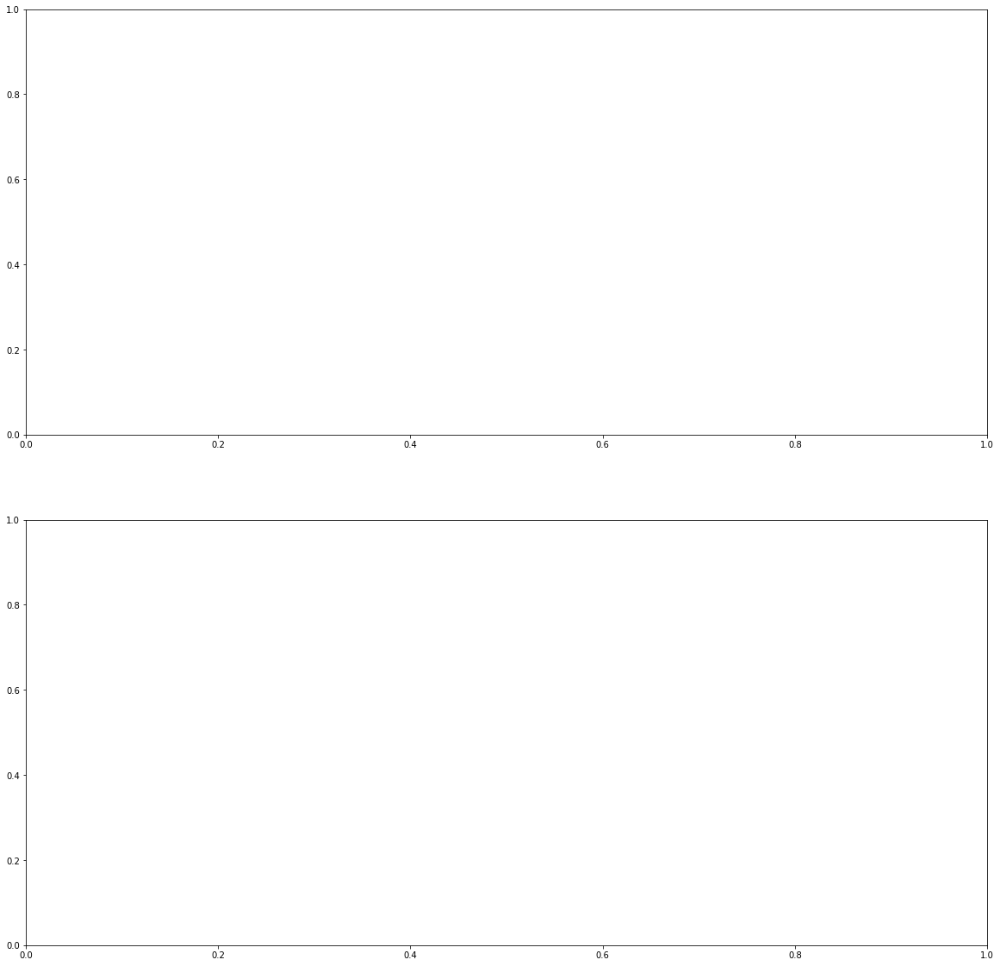

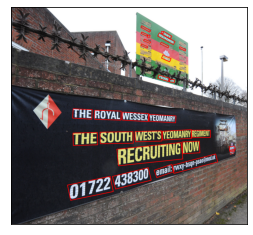

In [ ]:
import matplotlib.pyplot as plt

import keras_ocr

# keras-ocr will automatically download pretrained
# weights for the detector and recognizer.
pipeline = keras_ocr.pipeline.Pipeline()

# # Get a set of three example images
images = [
    keras_ocr.tools.read(url) for url in [
        'https://upload.wikimedia.org/wikipedia/commons/b/bd/Army_Reserves_Recruitment_Banner_MOD_45156284.jpg',
        # 'https://upload.wikimedia.org/wikipedia/commons/e/e8/FseeG2QeLXo.jpg',
        # '/content/Loot Zone.png',
        'https://upload.wikimedia.org/wikipedia/commons/b/b4/EUBanana-500x112.jpg'
    ]
]

# Each list of predictions in prediction_groups is a list of
# (word, box) tuples.
prediction_groups = pipeline.recognize(images)

# Plot the predictions
fig, axs = plt.subplots(nrows=len(images), figsize=(20, 20))
for ax, image, predictions in zip(axs, images, prediction_groups):
    keras_ocr.tools.drawAnnotations(image=image, predictions=predictions)

In [1]:
import cv2
import pytesseract
from pytesseract import Output

img = cv2.imread('/Users/KR20258655/Desktop/Loot Zone.png')

d = pytesseract.image_to_data(img, output_type=Output.DICT)
print(d.keys())

TesseractNotFoundError: ignored

In [2]:
# pip install pytesseract

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.1 MB 5.2 MB/s 
  Attempting uninstall: Pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
